One of the Author of the code, tried to clip the loss at a certain maximum value, but what they are doing is clipping the gradients to have a maximum value instead of clipping the loss at a maximum value. This causes the outlier to be ignored because when we clip a loss of an outlier it sets the gradient to zero,  

In [2]:
import torch 
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [3]:
words = open('datasets/names.txt').read().splitlines()
print(words[:10])  # Print the first 10 words to verify
print(f"Total words loaded: {len(words)}")

chars = sorted(list(set(''.join(words))))

# string to index mapping 
stoi = { ch:i+1 for i,ch in enumerate(chars)}
stoi['.'] = 0
print(f"String to index mapping: {stoi}")

itos = {i:s for s,i in stoi.items()}
print(itos)

vocab_size = len(itos)

['emma', 'olivia', 'ava', 'isabella', 'sophia', 'charlotte', 'mia', 'amelia', 'harper', 'evelyn']
Total words loaded: 32033
String to index mapping: {'a': 1, 'b': 2, 'c': 3, 'd': 4, 'e': 5, 'f': 6, 'g': 7, 'h': 8, 'i': 9, 'j': 10, 'k': 11, 'l': 12, 'm': 13, 'n': 14, 'o': 15, 'p': 16, 'q': 17, 'r': 18, 's': 19, 't': 20, 'u': 21, 'v': 22, 'w': 23, 'x': 24, 'y': 25, 'z': 26, '.': 0}
{1: 'a', 2: 'b', 3: 'c', 4: 'd', 5: 'e', 6: 'f', 7: 'g', 8: 'h', 9: 'i', 10: 'j', 11: 'k', 12: 'l', 13: 'm', 14: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 0: '.'}


In [4]:
# Build the dataset
import random
from typing import List

block_size = 3

def build_dataset(words: List[str], context_len: int=3):
    block_size = context_len 
    
    X,Y = [],[]

    block_size = 3

    for w in words:
        context = [0] * block_size

        for ch in w + '.':
            ix = stoi[ch]
            X.append(context)
            Y.append(ix)

            # print(''.join(itos[i] for i in context), '--->', itos[ix])
            context = context[1:] + [ix]

    # print(X)
    X = torch.tensor(X)
    Y = torch.tensor(Y)

    return X,Y
    # X.shape, X.dtype, Y.shape, Y.dtype


random.seed(42)
random.shuffle(words)
n1 = int(0.8*len(words))
n2 = int(0.9*len(words))

X_train,Y_train = build_dataset(words[:n1],block_size)
X_dev,Y_dev = build_dataset(words[n1:n2],block_size)
X_test,Y_test = build_dataset(words[n2:],block_size)

X_train.shape, X_dev.shape, X_test.shape

(torch.Size([182625, 3]), torch.Size([22655, 3]), torch.Size([22866, 3]))

This will help us check the calculated gradients of each variables by us vs the pytorch ones.

ex -> exact match  
app -> approximate match  
maxdiff -> maximum difference found when comparing calculated grad vs pytorch cal grad.  

In [18]:
def cmp(s, dt, t):
    ex = torch.all(dt == t.grad).item()
    app = torch.allclose(dt, t.grad)

    maxdiff = (dt - t.grad).abs().max().item()

    print(f"{s:15s} | Exact: {str(ex):5s} | Approx: {str(app):5s} | Maxdiff: {maxdiff:.8f}")

### Note:

Here we are initializing all the params to be randn (gaussian distribution).
As if the params **here referring b2 and b1, b1 not required as it has no effect due to batch-normalization, and b2 has to be zero so that at initialization our loss is an estimated loss and not an random arbittary loss, in this case to make the prediction of next character at initialization to be small (probablity is even at initialization)** are initialized to zero, sometimes what can happen is it can mask an incorrect implementation of the gradient.


In [25]:
n_embed = 10
n_hidden = 64

g = torch.Generator().manual_seed(2147483647)

C = torch.randn((vocab_size, n_embed), generator=g)
W1 = torch.randn((n_embed * block_size, n_hidden), generator=g) * (5/3)/((n_embed * block_size)**0.5)
b1 = torch.randn(n_hidden, generator=g) * 0.1 # Not needed as bias get subtracted out in batchnorm
W2 = torch.randn((n_hidden, vocab_size), generator=g) * 0.1 # to have logits in the right scale at intialization (giving equal probability)
b2 = torch.randn(vocab_size, generator=g) * 0.1

# batchnorm parameters
bngain = torch.randn((1, n_hidden)) * 0.1 + 0.1
bnbias = torch.randn((1, n_hidden)) * 0.1

parameters = [C, W1, b1, W2, b2, bngain, bnbias]

for p in parameters:
    p.requires_grad = True



##### Lets train our Single Batch of size 32

In [26]:
batch_size = 32

ix = torch.randint(0, X_train.shape[0], (batch_size,), generator=g)
ix
Xb, Yb = X_train[ix], Y_train[ix]
Xb.shape, Yb.shape

(torch.Size([32, 3]), torch.Size([32]))

In [ ]:
emb = C[Xb]
embcat = emb.view(emb.shape[0],-1)

# Linear layer 1
hprebn = embcat @ W1 + b1

bnmeani = hprebn.mean(0, keepdim=True) # calculating neurons avg ouput across the batch
bndiff = hprebn - bnmeani # this cancels b1 
bndiff2 = bndiff ** 2
bnvar = 1/(batch_size-1) * bndiff2.sum(0, keepdim=True) # bessel correction (n-1)
bnvar_inv = (bnvar + 1e-5)**-0.5
bnraw = bndiff * bnvar_inv 

hpreact = bngain * bnraw + bnbias

# introducing non-linearity
h = torch.tanh(hpreact)

# Linear layer 2
logits = h @ W2 + b2  

# Cross-entropy loss F.cross_entropy(logits, Yb)
logits_max = logits.max(1, keepdim=True).values
norm_logits = logits - logits_max  # subtracting max for numerical stability (makes sures that exp() does'nt overflow/blow)
counts = norm_logits.exp()
counts_sum = counts.sum(1, keepdim=True)
counts_sum_inv = counts_sum**-1
probs = counts * counts_sum_inv
logprobs = probs.log()
loss = -logprobs[torch.arange(batch_size), Yb].mean()
print(loss.item())

for p in parameters:
    p.grad = None

for t in [logprobs, probs, counts_sum_inv, counts_sum, counts, 
          norm_logits, logits_max, logits, 
          h, hpreact, bnraw, bnvar_inv, bnvar, bndiff2, bndiff, bnmeani, hprebn, embcat, emb]:
    t.retain_grad()

loss.backward()

loss

3.296776533126831


tensor(3.2968, grad_fn=<NegBackward0>)

In [28]:
logprobs.shape

torch.Size([32, 27])

#### Exercise One

Back-propagate, through the whole thing manually.  

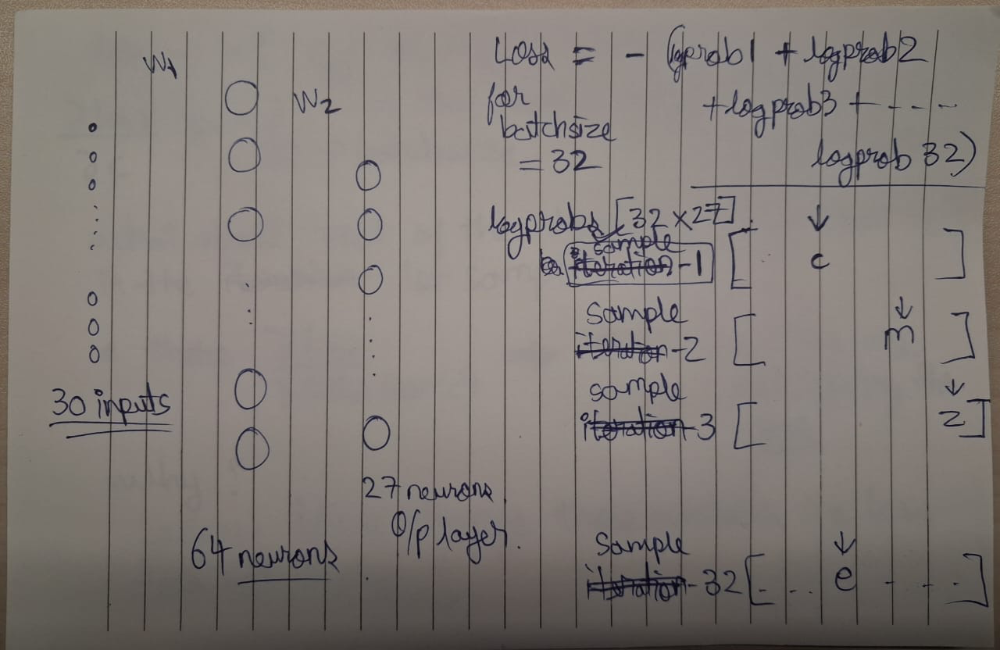

<br>

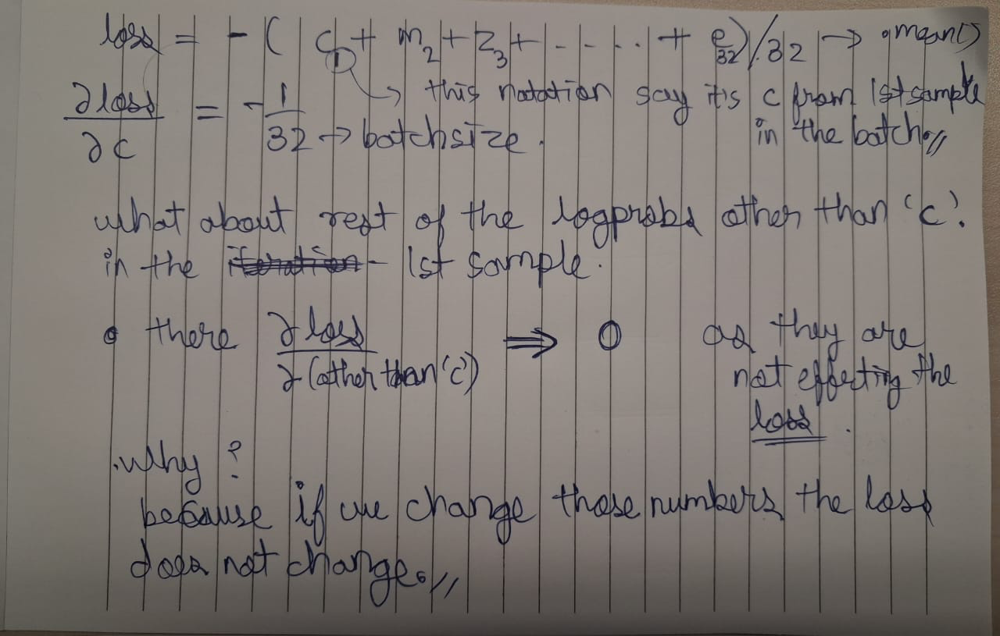

In [29]:
# We want the derivative loss w.r.t to all the elements of logprobs.

dlogprobs = torch.zeros_like(logprobs)
dlogprobs[torch.arange(batch_size), Yb] = -1.0/batch_size

cmp('logprobs', dlogprobs, logprobs)



logprobs        | Exact: True  | Approx: True  | Maxdiff: 0.00000000


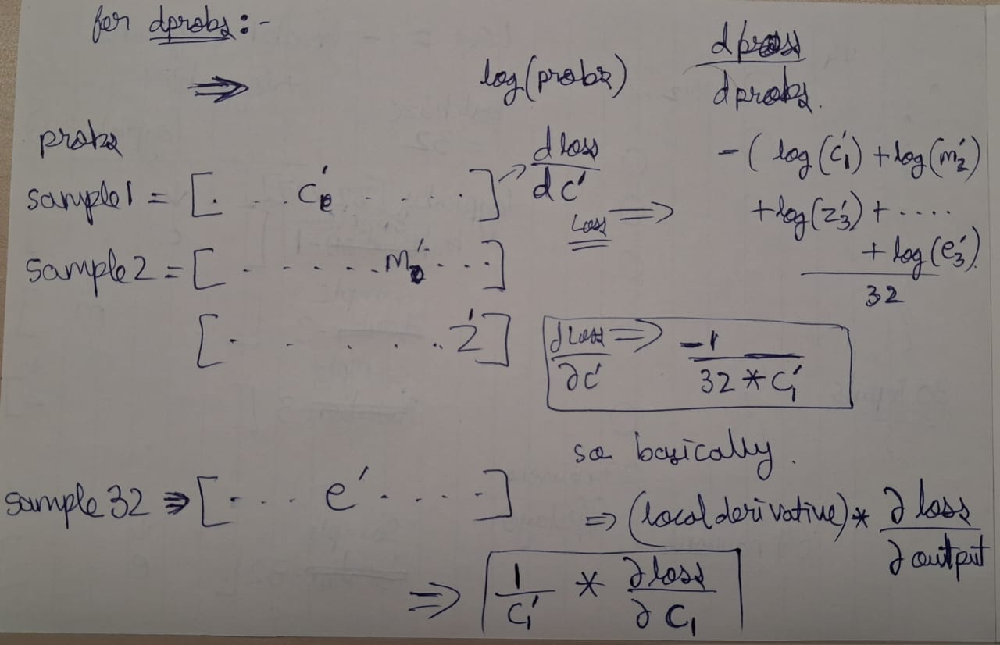

<br>

Here intuitively we observe that its taking the examples that have low probability (currently assigned) and boosting their gradient.

In [ ]:
dprobs = dlogprobs * (1/probs)

cmp('probs', dprobs, probs)

probs           | Exact: True  | Approx: True  | Maxdiff: 0.00000000


#### Note: 

An implicit broadcasting happens first and then the multiplication happens, here the column present in counts_sum_inv is replicated along the columns

probs = count [32,27] * counts_sum_inv [32,1]

For example:

c = a (3,3) * b (3,1)

a11 * b1, a12 * b1, a13 * b1 
a21 * b2, a22 * b2, a23 * b2
a31 * b3, a32 * b3, a33 * b3

So here we can see that the values of b are broadcasted at column level.

<br>

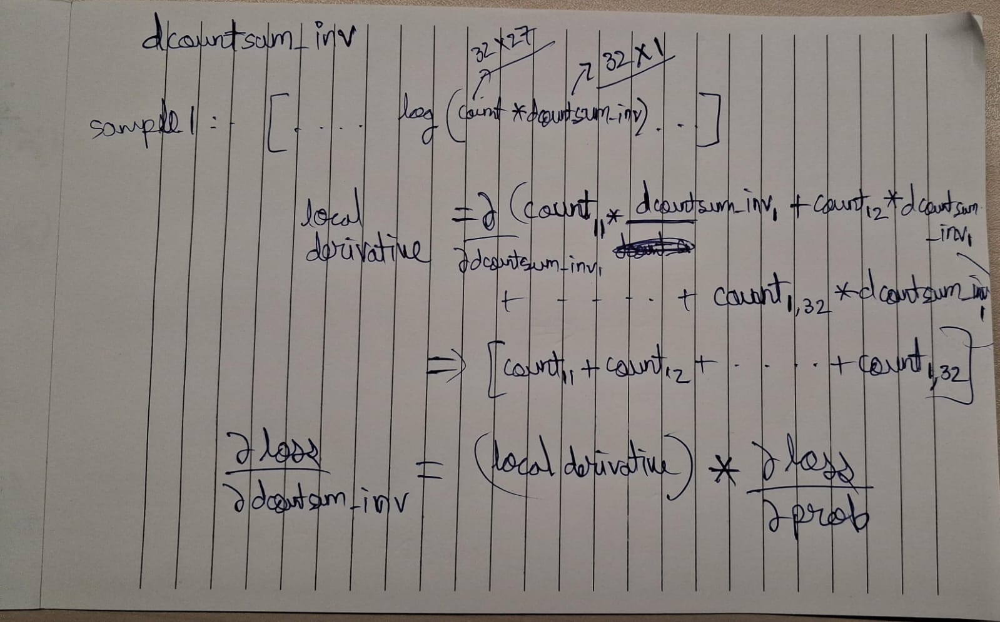

In [32]:
print(counts_sum_inv.shape)

dcounts_sum_inv = counts * dprobs
dcounts_sum_inv = dcounts_sum_inv.sum(1, keepdim=True)

cmp('counts_sum_inv', dcounts_sum_inv, counts_sum_inv)

torch.Size([32, 1])
counts_sum_inv  | Exact: True  | Approx: True  | Maxdiff: 0.00000000


#### Note:

While calculating dcounts it is getting gradient flow from 2 of the outs

<br>

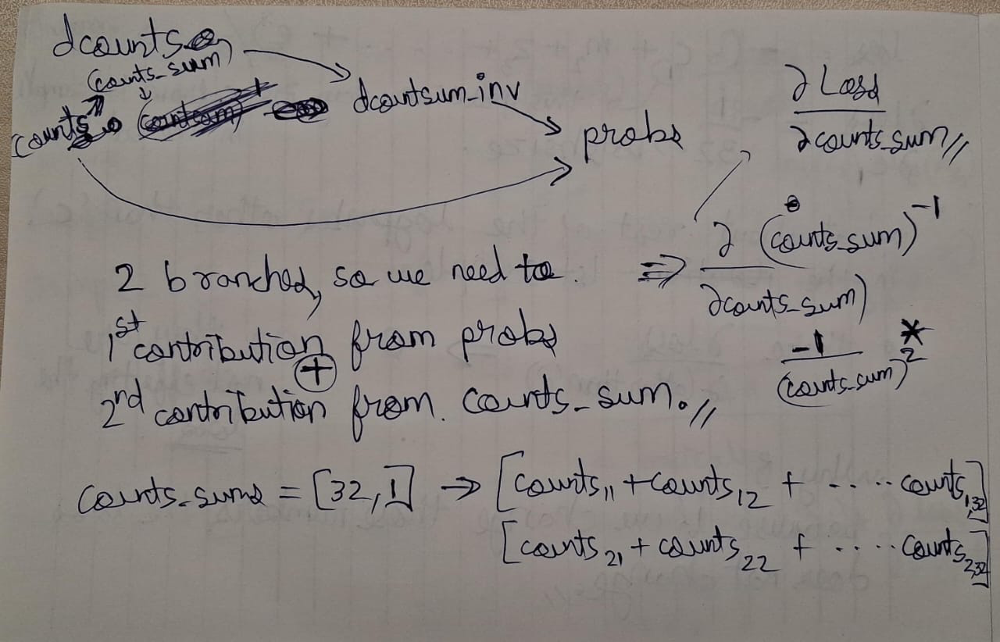

In [37]:
print(counts_sum.shape)
dcounts_sum = -1 * (counts_sum**-2) * dcounts_sum_inv

cmp('counts_sum', dcounts_sum, counts_sum)

torch.Size([32, 1])
counts_sum      | Exact: True  | Approx: True  | Maxdiff: 0.00000000


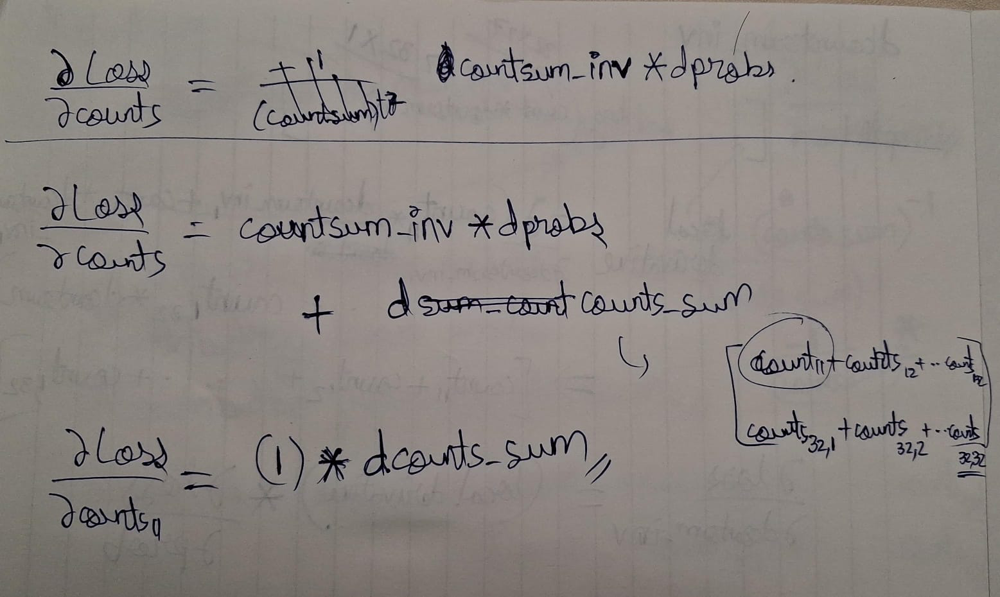

<br>

In addition whatever gradient comes from outputside is routed equally to all the nodes that are been added.

In [39]:
dcounts = counts_sum_inv * dprobs + torch.ones_like(counts)*dcounts_sum
cmp('counts', dcounts, counts)

counts          | Exact: True  | Approx: True  | Maxdiff: 0.00000000


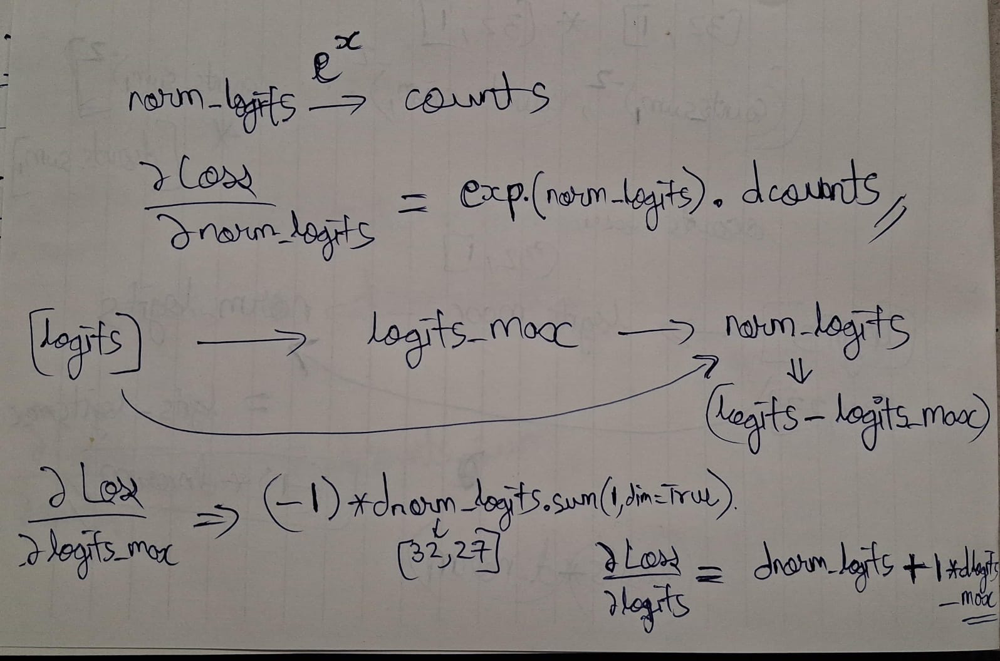

<br>

so the gradient flows from norm_logits to both logits_max and logits and gradient of logits_max also gets appended to logits gradient.

In [ ]:
dnorm_logits = (norm_logits.exp()) * dcounts # can also put counts here instead of norm_logits.exp()
cmp('norm_logits', dnorm_logits, norm_logits)

norm_logits     | Exact: True  | Approx: True  | Maxdiff: 0.00000000


In [46]:
print(norm_logits.shape, logits_max.shape, logits.shape)

dlogits_max = dnorm_logits.sum(1, keepdim=True) * -1
dlogits = dnorm_logits + F.one_hot(logits.max(1).indices, num_classes=logits.shape[1]) * dlogits_max

cmp('logits_max', dlogits_max, logits_max)
cmp('logits', dlogits, logits)

torch.Size([32, 27]) torch.Size([32, 1]) torch.Size([32, 27])
logits_max      | Exact: True  | Approx: True  | Maxdiff: 0.00000000
logits          | Exact: True  | Approx: True  | Maxdiff: 0.00000000


#### Note: 

Here we can observe that the gradient of dlogits_max actually doesnt have an affect on loss, as it is used for preventing exploding of the values (when .epx() applied on logits) hence any change in logits_max doesnt have any affect on the loss.

In [44]:
print(dlogits_max[:10])

tensor([[-2.7940e-09],
        [ 9.3132e-10],
        [ 1.8626e-09],
        [ 2.3283e-09],
        [ 1.8626e-09],
        [ 1.8626e-09],
        [-3.7253e-09],
        [-0.0000e+00],
        [-3.7253e-09],
        [ 9.3132e-10]], grad_fn=<SliceBackward0>)


-0.03125